In [1]:
import numpy as np
import pandas as pd
import pytz
import json
import csv
import matplotlib.pyplot as plt
import pytz
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.regression.linear_model import RegressionResults


In [13]:
line

'{"firstpost_date": 1422805490, "title": "It\'s time for the Super Bowl or as gay people call it The Straight Oacars... #SuperBowl #SuperBowlTweets", "url": "http://twitter.com/paul_lander/status/561913071107440641", "tweet": {"contributors": null, "truncated": false, "text": "It\'s time for the Super Bowl or as gay people call it The Straight Oacars... #SuperBowl #SuperBowlTweets", "in_reply_to_status_id": null, "id": 561913071107440641, "favorite_count": 3, "source": "<a href=\\"http://twitter.com/download/iphone\\" rel=\\"nofollow\\">Twitter for iPhone</a>", "retweeted": false, "coordinates": null, "entities": {"symbols": [], "user_mentions": [], "trends": [], "hashtags": [{"indices": [77, 87], "text": "SuperBowl"}, {"indices": [88, 104], "text": "SuperBowlTweets"}], "urls": []}, "in_reply_to_screen_name": null, "in_reply_to_user_id": null, "retweet_count": 1, "id_str": "561913071107440641", "favorited": false, "user": {"follow_request_sent": null, "profile_use_background_image": tr

In [14]:
#Data pre-processing
filenames = ['ECE219_tweet_data/tweets_#gohawks.txt',
            'ECE219_tweet_data/tweets_#gopatriots.txt',
            'ECE219_tweet_data/tweets_#nfl.txt',
            'ECE219_tweet_data/tweets_#patriots.txt',
            'ECE219_tweet_data/tweets_#sb49.txt',
            'ECE219_tweet_data/tweets_#superbowl.txt'
            ]

output_filenames = ['output/Q1_2#gohawks.txt',
                    'output/Q1_2#gopatriots.txt',
                   'output/Q1_2#nfl.txt',
                   'output/Q1_2#patriots.txt',
                   'output/Q1_2#sb49.txt',
                   'output/Q1_2#superbowl.txt']

for i in range(len(filenames)):
    pst_tz = pytz.timezone('US/Pacific')
    
    with open(filenames[i], 'r',encoding="utf8") as reader:
        headers = [
                   'citation_date_raw',
                   'author_nick_names',
                   'tweets',
                   'retweets',
                   'followers',
                   'followers_max'
                  ]
        with open(output_filenames[i], 'w') as writer:
            csv_writer = csv.writer(writer, lineterminator='\n')
            csv_writer.writerow(headers)
            for line in reader:
                data = json.loads(line)
                response =  [
                            data['citation_date'],
                            data['author']['nick'],
                            1, # there is one tweet at a time..
                            data['metrics']['citations']['total'], #retweets
                            data['author']['followers'], #followers
                            data['author']['followers'], #followers
                             ]
                csv_writer.writerow(response)

## Question1

In [15]:
gohawks = pd.read_csv('output/Q1_2#gohawks.txt',delimiter=',')
gopatriots = pd.read_csv('output/Q1_2#gopatriots.txt',delimiter=',')
nfl = pd.read_csv('output/Q1_2#nfl.txt',delimiter=',')
patriots = pd.read_csv('output/Q1_2#patriots.txt',delimiter=',')
sb49 = pd.read_csv('output/Q1_2#sb49.txt',delimiter=',')
superbowl = pd.read_csv('output/Q1_2#superbowl.txt',delimiter=',')

In [16]:
# parse date for use down below.
def parse_date_pst(df):
    utc_tz = pytz.UTC
    pst_tz = pytz.timezone('America/Los_Angeles')
    df['citation_date'] = pd.to_datetime(df['citation_date_raw'], unit='s')
    df['citation_date_pst'] = pd.to_datetime(df['citation_date_raw'], unit='s').apply(lambda x: x.tz_localize(utc_tz).astimezone(pst_tz))
    df['date'] = df['citation_date_pst'].apply(lambda x: x.strftime('%Y%m%d'))
    df['hour'] = df['citation_date_pst'].apply(lambda x: x.hour)
    df['minute'] = df['citation_date_pst'].apply(lambda x: x.minute)

parse_date_pst(gohawks)
parse_date_pst(gopatriots)
parse_date_pst(nfl)
parse_date_pst(patriots)
parse_date_pst(sb49)
parse_date_pst(superbowl)

In [17]:
def get_basic_statistics(dataframe):
    max = dataframe.max()
    min = dataframe.min()
    avg_tweets_per_hour = dataframe['tweets'].sum() / ((max['citation_date_pst'] - min['citation_date_pst']).total_seconds() / 60 / 60)
    print('Average tweets per hour:',avg_tweets_per_hour)
    
    avg_followers_posting_tweets = dataframe['followers'].sum() / dataframe['tweets'].sum()
    print('Average number of users posting tweets per tweet:', avg_followers_posting_tweets)
    
    avg_retweet_per_tweet = dataframe['retweets'].sum() / dataframe['tweets'].sum()
    print('Average number of retweet per tweet:', avg_retweet_per_tweet)
# go hawks
print('GoHawks')
get_basic_statistics(gohawks)

#go patriots
print('GoPatriots')
get_basic_statistics(gopatriots)

print('NFL')
get_basic_statistics(nfl)

print('Patriots')
get_basic_statistics(patriots)

print('Sb49')
get_basic_statistics(sb49)

print('Superbowl')
get_basic_statistics(superbowl)

GoHawks
Average tweets per hour: 292.48785062173687
Average number of users posting tweets per tweet: 2217.9237355281984
Average number of retweet per tweet: 2.0132093991319877
GoPatriots
Average tweets per hour: 40.95469800606194
Average number of users posting tweets per tweet: 1427.2526051635405
Average number of retweet per tweet: 1.4081919101697078
NFL
Average tweets per hour: 397.0213901819841
Average number of users posting tweets per tweet: 4662.37544523693
Average number of retweet per tweet: 1.5344602655543254
Patriots
Average tweets per hour: 750.89426460689
Average number of users posting tweets per tweet: 3280.4635616550277
Average number of retweet per tweet: 1.7852871288476946
Sb49


KeyError: 'citation_date_pst'

## Question 2

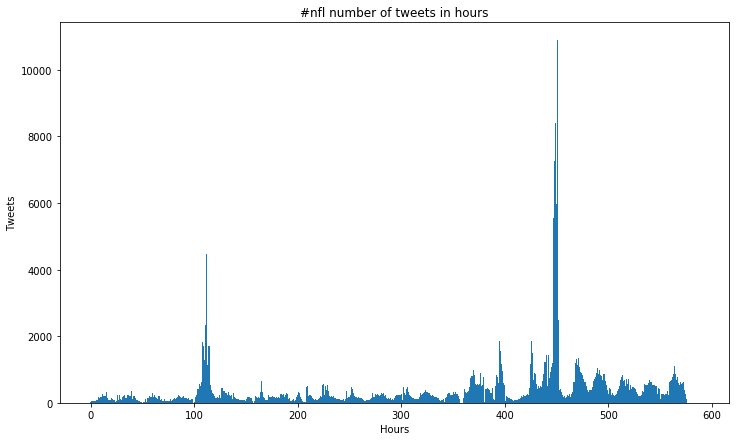

In [18]:
#NFL
max = nfl.max()
min = nfl.min()
nfl['time_hour'] = nfl['citation_date'].apply(lambda x: round((x - min['citation_date']).total_seconds()/60/60))
nfl_time_hour = nfl.groupby('time_hour').sum()
nfl_x = list(nfl_time_hour.index)
nfl_y = list(nfl_time_hour.tweets)

plt.figure(figsize=(12,7))
plt.bar(nfl_x, nfl_y, width=nfl_x[1]-nfl_x[0])
plt.xlabel('Hours')
plt.ylabel('Tweets')
plt.title('#nfl number of tweets in hours')
plt.show()

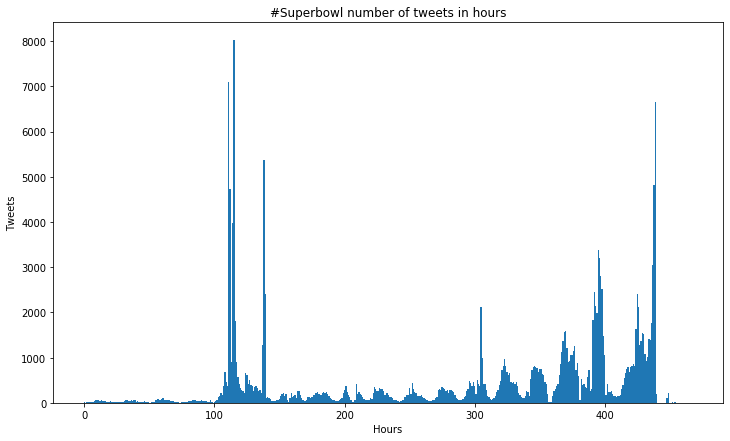

In [19]:
#Superbowl
max = superbowl.max()
min = superbowl.min()
superbowl['time_hour'] = superbowl['citation_date'].apply(lambda x: round((x - min['citation_date']).total_seconds()/60/60))
superbowl_time_hour = superbowl.groupby('time_hour').sum()
superbowl_time_hour_x = list(superbowl_time_hour.index)
superbowl_time_hour_y = list(superbowl_time_hour.tweets)

plt.figure(figsize=(12,7))
plt.bar(superbowl_time_hour_x, superbowl_time_hour_y, width=superbowl_time_hour_x[1]-superbowl_time_hour_x[0])
plt.xlabel('Hours')
plt.ylabel('Tweets')
plt.title('#Superbowl number of tweets in hours')
plt.show()

## Question 3

In [20]:
def train_ols(df_agg, title: 'Generic stuff...'):
    print('=============================',title,'======================================')

    #train ols here
    model = ols("future_tweets ~ tweets + hour + retweets + followers + followers_max", data=df_agg).fit()
    print(model.summary())
    print('==============================MSE==============================================')
    print("MSE_residual:",model.mse_resid)
    print('==============================R-squared==============================================')
    print("R2:",model.rsquared)    
    fig, ax = plt.subplots()
    fig = sm.graphics.plot_fit(model, "hour", ax=ax)
    plt.show()
    
    fig1, ax1 = plt.subplots()
    fig1 = sm.graphics.plot_fit(model, "tweets", ax=ax1)
    plt.show()
    
    fig2, ax2 = plt.subplots()
    fig2 = sm.graphics.plot_fit(model, "retweets", ax=ax2)
    plt.show()
    
    fig3, ax3 = plt.subplots()
    fig3 = sm.graphics.plot_fit(model, "followers", ax=ax3)
    plt.show()
    
    fig4, ax4 = plt.subplots()
    fig4 = sm.graphics.plot_fit(model, "followers_max", ax=ax4)
    plt.show()
    
    return model

============================= Gohawks aggregated ======================================
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.476
Model:                            OLS   Adj. R-squared:                  0.471
Method:                 Least Squares   F-statistic:                     102.3
Date:                Tue, 17 Mar 2020   Prob (F-statistic):           1.10e-76
Time:                        08:38:35   Log-Likelihood:                -4663.7
No. Observations:                 569   AIC:                             9339.
Df Residuals:                     563   BIC:                             9365.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

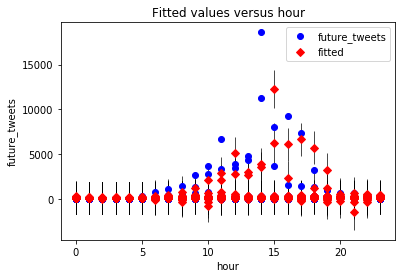

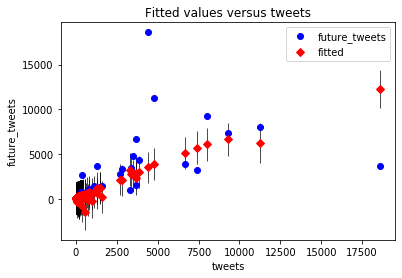

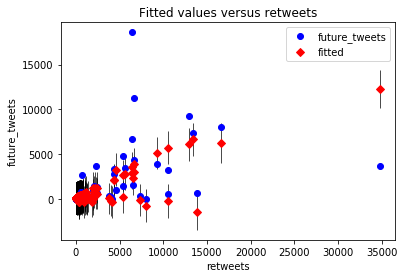

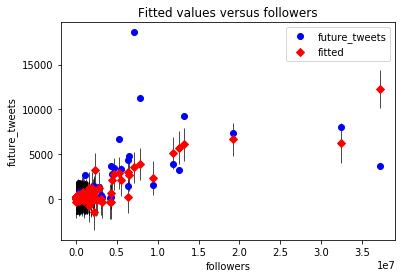

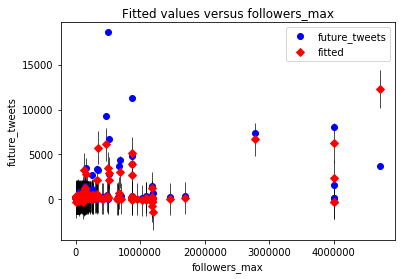

In [21]:
#gohawks
gohawks_agg = gohawks.groupby(pd.Grouper(key='citation_date_pst',freq='60Min')).agg({
    'hour':'max',
    'tweets':'sum',
    'retweets':'sum',
    'followers':'sum',
    'followers_max':'max'
})
gohawks_agg['future_tweets'] = gohawks_agg['tweets']
gohawks_agg.future_tweets = gohawks_agg.future_tweets.shift(-1)
gohawks_model = train_ols(gohawks_agg, 'Gohawks aggregated')

============================= GoPatriots aggregated ======================================
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     146.0
Date:                Tue, 17 Mar 2020   Prob (F-statistic):           1.33e-90
Time:                        08:39:26   Log-Likelihood:                -2932.2
No. Observations:                 440   AIC:                             5876.
Df Residuals:                     434   BIC:                             5901.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

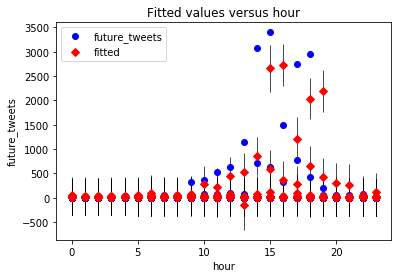

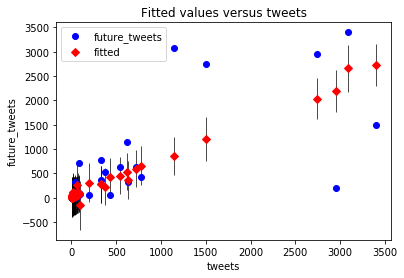

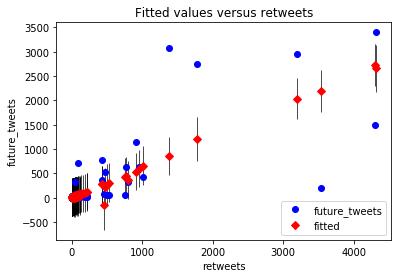

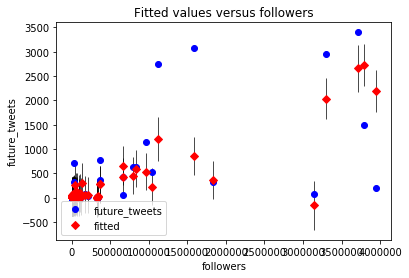

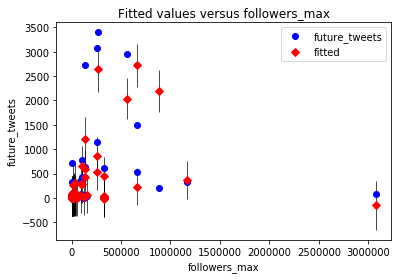

In [22]:
#gopatriots
gopatriots_agg = gopatriots.groupby(pd.Grouper(key='citation_date_pst',freq='60Min')).agg({
    'hour':'max',
    'tweets':'sum',
    'retweets':'sum',
    'followers':'sum',
    'followers_max':'max'
})
gopatriots_agg['future_tweets'] = gopatriots_agg['tweets']
gopatriots_agg.future_tweets = gopatriots_agg.future_tweets.shift(-1)
gopatriots_model = train_ols(gopatriots_agg, 'GoPatriots aggregated')

============================= nlf aggregated ======================================
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.570
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                     152.9
Date:                Tue, 17 Mar 2020   Prob (F-statistic):          3.57e-103
Time:                        08:39:29   Log-Likelihood:                -4467.0
No. Observations:                 582   AIC:                             8946.
Df Residuals:                     576   BIC:                             8972.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

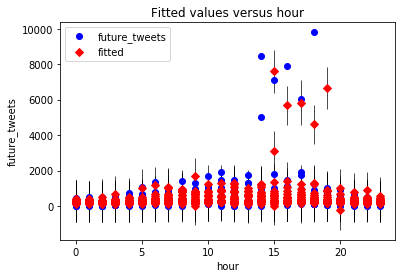

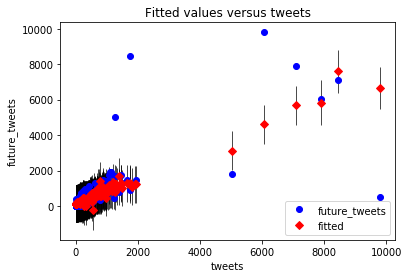

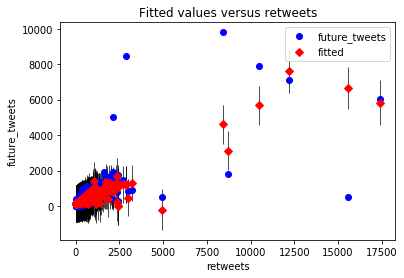

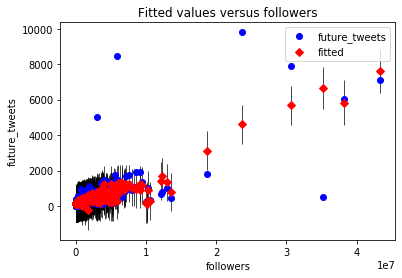

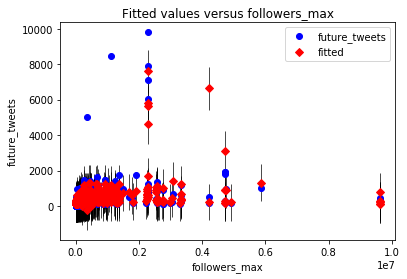

In [23]:
#nfl
nfl_agg = nfl.groupby(pd.Grouper(key='citation_date_pst',freq='60Min')).agg({
    'hour':'max',
    'tweets':'sum',
    'retweets':'sum',
    'followers':'sum',
    'followers_max':'max'
})
nfl_agg['future_tweets'] = nfl_agg['tweets']
nfl_agg.future_tweets = nfl_agg.future_tweets.shift(-1)
nfl_model = train_ols(nfl_agg, 'nlf aggregated')

============================= patriots aggregated ======================================
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.668
Model:                            OLS   Adj. R-squared:                  0.666
Method:                 Least Squares   F-statistic:                     233.8
Date:                Tue, 17 Mar 2020   Prob (F-statistic):          1.91e-136
Time:                        08:39:48   Log-Likelihood:                -5361.4
No. Observations:                 586   AIC:                         1.073e+04
Df Residuals:                     580   BIC:                         1.076e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

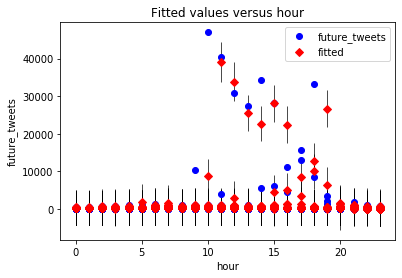

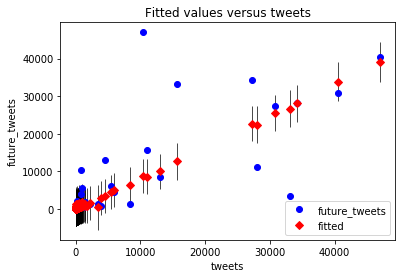

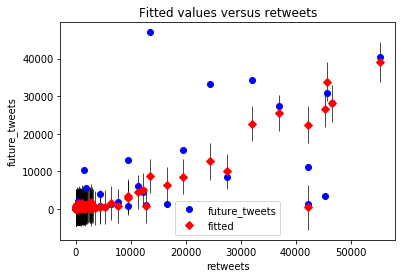

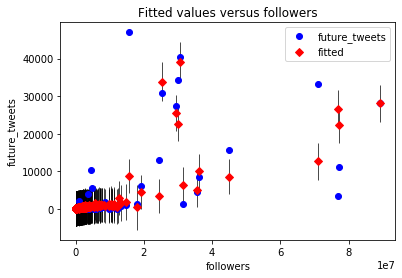

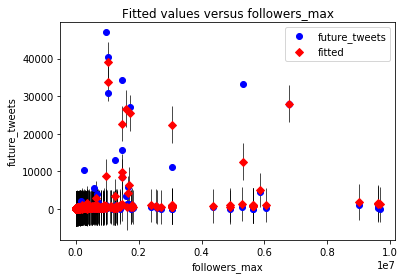

In [24]:
#patriots
patriots_agg = patriots.groupby(pd.Grouper(key='citation_date_pst',freq='60Min')).agg({
    'hour':'max',
    'tweets':'sum',
    'retweets':'sum',
    'followers':'sum',
    'followers_max':'max'
})
patriots_agg['future_tweets'] = patriots_agg['tweets']
patriots_agg.future_tweets = patriots_agg.future_tweets.shift(-1)
patriots_model = train_ols(patriots_agg, 'patriots aggregated')

============================= sb49 aggregated ======================================
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.804
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     435.6
Date:                Tue, 17 Mar 2020   Prob (F-statistic):          4.54e-185
Time:                        08:39:53   Log-Likelihood:                -5231.3
No. Observations:                 536   AIC:                         1.047e+04
Df Residuals:                     530   BIC:                         1.050e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

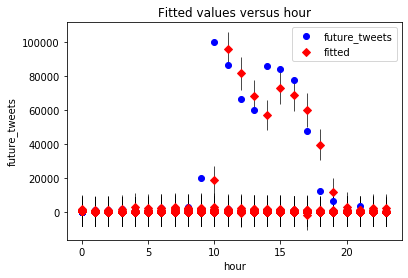

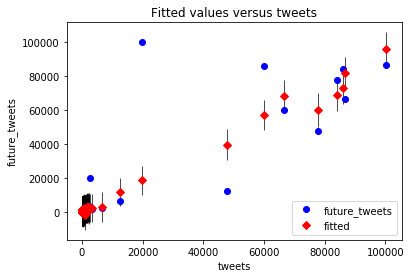

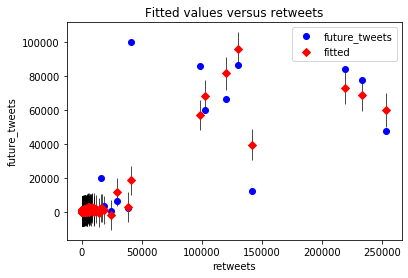

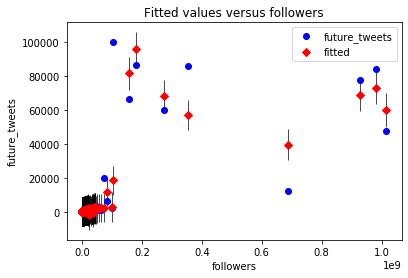

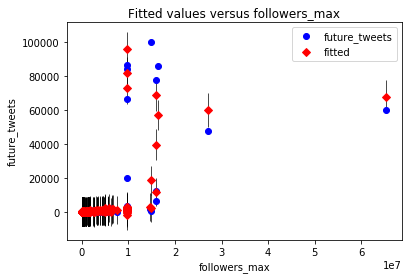

In [25]:
#sb49
sb49_agg = sb49.groupby(pd.Grouper(key='citation_date_pst',freq='60Min')).agg({
    'hour':'max',
    'tweets':'sum',
    'retweets':'sum',
    'followers':'sum',
    'followers_max':'max'
})
sb49_agg['future_tweets'] = sb49_agg['tweets']
sb49_agg.future_tweets = sb49_agg.future_tweets.shift(-1)
sb49_model = train_ols(sb49_agg, 'sb49 aggregated')

============================= superbowl aggregated ======================================
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.358
Model:                            OLS   Adj. R-squared:                  0.351
Method:                 Least Squares   F-statistic:                     49.94
Date:                Tue, 17 Mar 2020   Prob (F-statistic):           4.40e-41
Time:                        08:39:56   Log-Likelihood:                -3626.3
No. Observations:                 454   AIC:                             7265.
Df Residuals:                     448   BIC:                             7289.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------

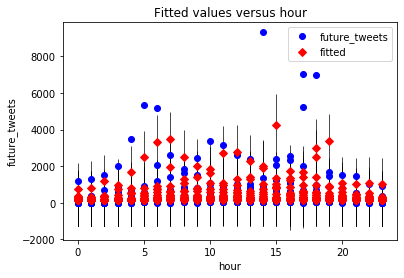

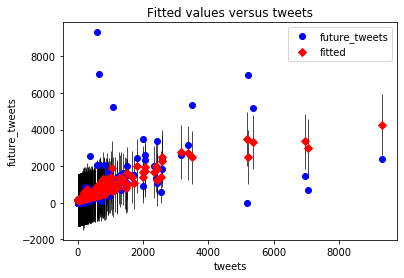

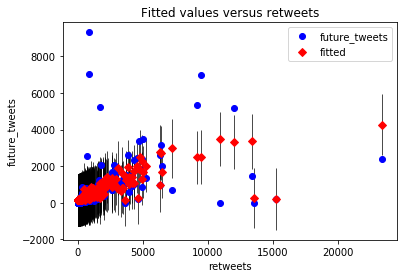

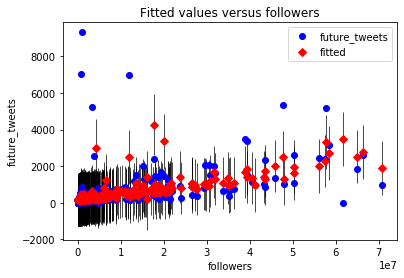

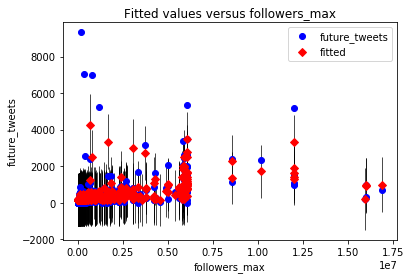

In [26]:
#superbowl
superbowl_agg = superbowl.groupby(pd.Grouper(key='citation_date_pst',freq='60Min')).agg({
    'hour':'max',
    'tweets':'sum',
    'retweets':'sum',
    'followers':'sum',
    'followers_max':'max'
})
superbowl_agg['future_tweets'] = superbowl_agg['tweets']
superbowl_agg.future_tweets = superbowl_agg.future_tweets.shift(-1)
superbowl_model = train_ols(superbowl_agg, 'superbowl aggregated')

## Question 4

In [295]:
feature_filenames = ['ECE219_tweet_data/tweets_#gohawks.txt',
            'ECE219_tweet_data/tweets_#gopatriots.txt',
            'ECE219_tweet_data/tweets_#nfl.txt',
            'ECE219_tweet_data/tweets_#patriots.txt',
            'ECE219_tweet_data/tweets_#sb49.txt',
            'ECE219_tweet_data/tweets_#superbowl.txt'
            ]

feature_output_filenames = ['output/Q1_4#gohawks.txt',
                   'output/Q1_4#gopatriots.txt',
                   'output/Q1_4#nfl.txt',
                   'output/Q1_4#patriots.txt',
                   'output/Q1_4#sb49.txt',
                   'output/Q1_4#superbowl.txt']

for i in range(len(feature_filenames)):
    pst_tz = pytz.timezone('US/Pacific')
    
    with open(feature_filenames[i], 'r',encoding="utf8") as reader:
        feature_headers = [
                   'citation_date_raw',
                   'author_nick_names',
                   'tweets',
                   'retweets',
                   'urls',
                   'mentions',
                   'hashtags',
                   'followers',
                   'followers_max',
                  ]
        with open(feature_output_filenames[i], 'w') as writer:
            feature_csv_writer = csv.writer(writer, lineterminator='\n')
            feature_csv_writer.writerow(feature_headers)
            for line in reader:
                feature_data = json.loads(line)
                feature_response =  [
                            feature_data['citation_date'],
                            feature_data['author']['nick'],
                            1, # there is one tweet at a time..
                            feature_data['metrics']['citations']['total'], #retweets
                            len(feature_data['tweet']['entities']['urls']), #urls
                            len(feature_data['tweet']['entities']['user_mentions']), #mentions
                            len(feature_data['tweet']['entities']['hashtags']), #hashtags
                            feature_data['author']['followers'], #followers
                            feature_data['author']['followers'], #followers
                             ]
                feature_csv_writer.writerow(feature_response)

In [28]:
feature_gohawks = pd.read_csv('output/Q1_4#gohawks.txt',delimiter=',')
feature_gopatriots = pd.read_csv('output/Q1_4#gopatriots.txt',delimiter=',')
feature_nfl = pd.read_csv('output/Q1_4#nfl.txt',delimiter=',')
feature_patriots = pd.read_csv('output/Q1_4#patriots.txt',delimiter=',')
feature_sb49 = pd.read_csv('output/Q1_4#sb49.txt',delimiter=',')
feature_superbowl = pd.read_csv('output/Q1_4#superbowl.txt',delimiter=',')
# parse date for use down below.
parse_date_pst(feature_gohawks)
parse_date_pst(feature_gopatriots)
parse_date_pst(feature_nfl)
parse_date_pst(feature_patriots)
parse_date_pst(feature_sb49)
parse_date_pst(feature_superbowl)

In [29]:
# select new feature and groupby
def group_features(df):
    df_agg = df.groupby(pd.Grouper(key='citation_date_pst',freq='60Min')).agg({
        'hour':'max',
        'tweets':'sum',
        'retweets':'sum',
        'urls':'sum',
        'mentions':'sum',
        'hashtags':'sum',
        'followers':'sum',
        'followers_max':'max'
    })
    
    return df_agg

feature_gohawks_agg = group_features(feature_gohawks)
feature_gopatriots_agg = group_features(feature_gopatriots)
feature_nfl_agg = group_features(feature_nfl)
feature_patriots_agg = group_features(feature_patriots)
feature_sb49_agg = group_features(feature_sb49)
feature_superbowl_agg = group_features(feature_superbowl)

In [30]:
def significant_features(model, f):
    sig_features = {}
    pval = []
    for i in range(1,len(f)+1):
        pval.append(model.pvalues[i])
    
    for i in range(len(pval)):
        min_val = np.min(pval)
        min_feat = f[pval.index(np.min(pval))]
        sig_features[min_feat] = min_val
        pval.remove(min_val)
        f.remove(min_feat)
    print("Features used and their p-value significance: ", sig_features)
    return sig_features

def regression_model(df, name):
    print("\n=============================" +  name + "=============================")
    df['future_tweets'] = df['tweets']
    df.future_tweets = df.future_tweets.shift(-1)
    model = ols("future_tweets ~ tweets + hour + retweets + urls + mentions + hashtags + followers + followers_max", data=df).fit()
    features = ['tweets', 'hour', 'retweets', 'urls', 'mentions', 'hashtags', 'followers', 'followers_max']
    print("MSE_residual:",model.mse_resid)
    features = significant_features(model, features)
    ypred = model.predict(df)
    print(model.summary())
    return features, ypred

top_features_gohawks_agg, gohawks_pred = regression_model(feature_gohawks_agg, "#gohawks")
top_features_gopatriots_agg, gopatriots_pred = regression_model(feature_gopatriots_agg, "#gopatriots")
top_features_nfl_agg, nfl_pred = regression_model(feature_nfl_agg, "#nfl")
top_features_patriots_agg, patriots_pred = regression_model(feature_patriots_agg, "#patriots")
top_features_sb49_agg, sb49_pred = regression_model(feature_sb49_agg, "#sb49")
top_features_superbowl_agg, superbowl_pred = regression_model(feature_superbowl_agg, "#superbowl")


=============================#gohawks=============================
MSE_residual: 639814.1565025368
Features used and their p-value significance:  {'followers': 8.660688942383258e-07, 'hashtags': 0.0016929458522442432, 'urls': 0.013022315748796335, 'mentions': 0.03046440032678708, 'followers_max': 0.07494436574141447, 'tweets': 0.2567930779724698, 'retweets': 0.40869342190618363, 'hour': 0.8035119962305588}
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.572
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     93.47
Date:                Tue, 17 Mar 2020   Prob (F-statistic):           5.19e-98
Time:                        08:43:55   Log-Likelihood:                -4606.3
No. Observations:                 569   AIC:                             9231.
Df Residuals:                     56

## Question 5



=============================#gohawks=============================


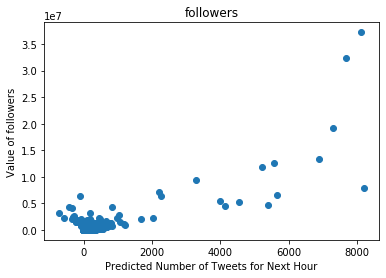

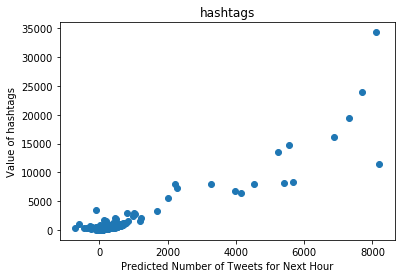

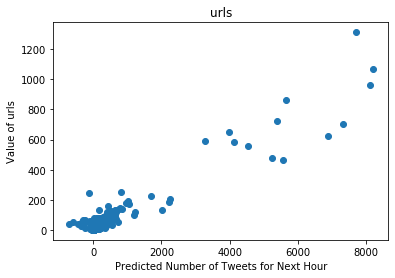



=============================#gopatriots=============================


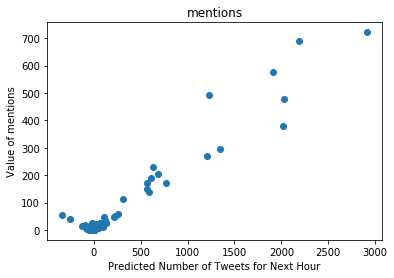

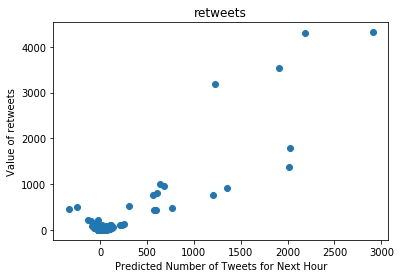

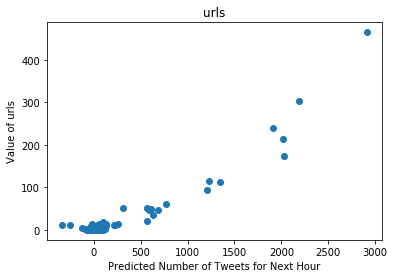



=============================#nfl=============================


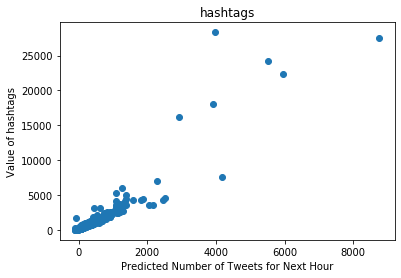

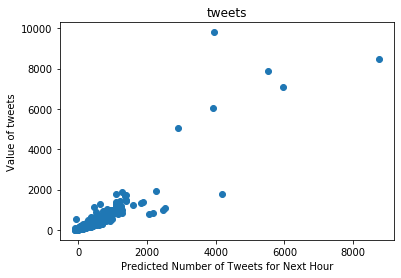

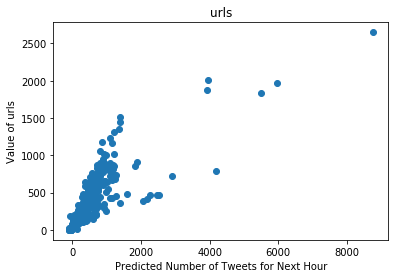



=============================#patriots=============================


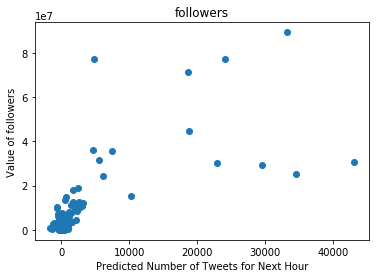

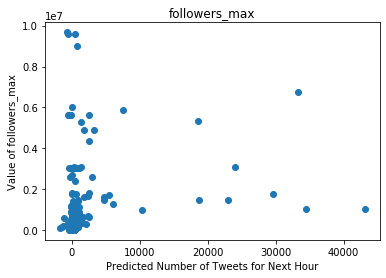

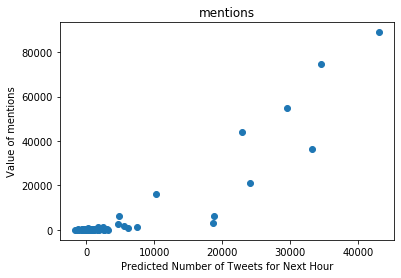



=============================#sb49=============================


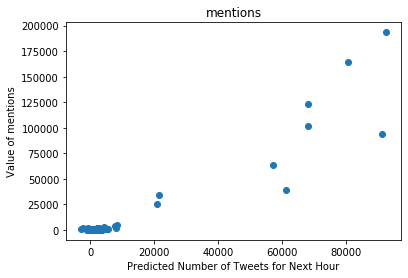

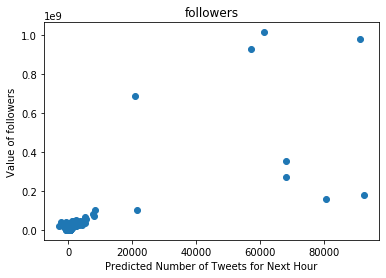

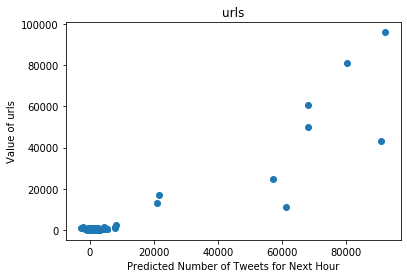



=============================#superbowl=============================


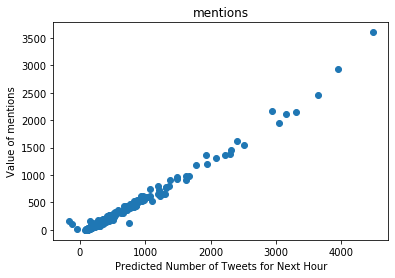

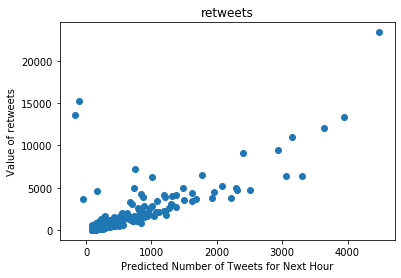

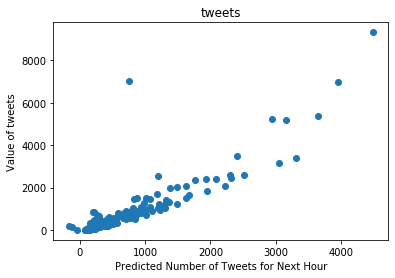

In [33]:
def scatter_plotter(x, y, name):
    plt.plot(x, y, 'o')

    plt.title(name)
    plt.xlabel('Predicted Number of Tweets for Next Hour')
    plt.ylabel('Value of ' + name)
    plt.show()
    return
def top_three_features(f, name, pred, df):
    print("\n\n=============================" + name + "=============================")
    top_f = {k: f[k] for k in list(f)[:3]}
    for key in top_f.keys():
        scatter_plotter(list(pred), list(df[key]), key)
    return
top_three_gohawks = top_three_features(top_features_gohawks_agg, "#gohawks", gohawks_pred, feature_gohawks_agg)
top_three_gopatriots = top_three_features(top_features_gopatriots_agg, "#gopatriots", gopatriots_pred, feature_gopatriots_agg)
top_three_nfl = top_three_features(top_features_nfl_agg, "#nfl", nfl_pred, feature_nfl_agg)
top_three_patriots = top_three_features(top_features_patriots_agg, "#patriots", patriots_pred, feature_patriots_agg)
top_three_sb49 = top_three_features(top_features_sb49_agg, "#sb49", sb49_pred, feature_sb49_agg)
top_three_superbowl = top_three_features(top_features_superbowl_agg, "#superbowl", superbowl_pred, feature_superbowl_agg)

# Question 6

In [36]:
feature_gohawks = pd.read_csv('output/Q1_4#gohawks.txt',delimiter=',')
feature_gopatriots = pd.read_csv('output/Q1_4#gopatriots.txt',delimiter=',')
feature_nfl = pd.read_csv('output/Q1_4#nfl.txt',delimiter=',')
feature_patriots = pd.read_csv('output/Q1_4#patriots.txt',delimiter=',')
feature_sb49 = pd.read_csv('output/Q1_4#sb49.txt',delimiter=',')
feature_superbowl = pd.read_csv('output/Q1_4#superbowl.txt',delimiter=',')
# parse date for use down below.
parse_date_pst(feature_gohawks)
parse_date_pst(feature_gopatriots)
parse_date_pst(feature_nfl)
parse_date_pst(feature_patriots)
parse_date_pst(feature_sb49)
parse_date_pst(feature_superbowl)

In [141]:
feature_gohawks.date.astype('int') 

0         20150117
1         20150114
2         20150116
3         20150116
4         20150116
5         20150116
6         20150116
7         20150116
8         20150116
9         20150116
10        20150116
11        20150116
12        20150116
13        20150116
14        20150116
15        20150116
16        20150117
17        20150116
18        20150116
19        20150116
20        20150114
21        20150116
22        20150116
23        20150116
24        20150117
25        20150115
26        20150114
27        20150116
28        20150114
29        20150114
            ...   
169092    20150206
169093    20150206
169094    20150206
169095    20150206
169096    20150206
169097    20150206
169098    20150206
169099    20150206
169100    20150206
169101    20150206
169102    20150206
169103    20150206
169104    20150206
169105    20150206
169106    20150206
169107    20150206
169108    20150206
169109    20150206
169110    20150206
169111    20150206
169112    20150206
169113    20

In [198]:
def piecewise_group_features(df, min_bin):
    df_agg = df.groupby(pd.Grouper(key='citation_date_pst',freq='%iMin'%min_bin)).agg({
        'hour':'max',
        'minute':'max',
        'tweets':'sum',
        'retweets':'sum',
        'urls':'sum',
        'mentions':'sum',
        'hashtags':'sum',
        'followers':'sum',
        'followers_max':'max'
    })
    if min_bin == 60:
        df_agg['minute'] = 0
    return df_agg.dropna()

def piecewise_regression(df, name):
    print("\n=============================" +  name + "=============================")

    # split the data
    prior_date_data = df.loc[df['date'].astype('int') < 20150201]
    date_data = df.loc[df['date'].astype('int') == 20150201]
    post_date_data = df.loc[df['date'].astype('int') > 20150201]

    sub_df_1 = pd.concat([prior_date_data, date_data.loc[date_data['hour'] <= 7]]) 
    sub_df_2 = date_data.loc[(date_data['hour'] >= 8) & (date_data['hour'] <= 19)]
    sub_df_3 = pd.concat([post_date_data, date_data.loc[date_data['hour'] >= 20]]) 

    sub_df_1_agg, sub_df_3_agg = piecewise_group_features(sub_df_1, 60), piecewise_group_features(sub_df_3, 60)
    sub_df_2_agg = piecewise_group_features(sub_df_2, 5)

    piecewise_ols = []
    features = ['tweets', 'hour', 'retweets', 'urls', 'mentions', 'hashtags', 'followers', 'followers_max']

    # 1st model
    sub_df_1_agg['future_tweets'] = sub_df_1_agg['tweets']
    sub_df_1_agg.future_tweets = sub_df_1_agg.future_tweets.shift(-1)
    model_1 = ols("future_tweets ~ tweets + hour + retweets + urls + mentions + hashtags + followers + followers_max", data=sub_df_1_agg).fit()
    piecewise_ols.append(model_1) 
    print("MSE_residual:",model_1.mse_resid)
    features_1 = significant_features(model_1, features)
    ypred_1 = model_1.predict(sub_df_1_agg)
    print(model_1.summary())

    # 2nd model
    sub_df_2_agg['future_tweets'] = sub_df_2_agg['tweets']
    sub_df_2_agg.future_tweets = sub_df_2_agg.future_tweets.shift(-1)
    model_2 = ols("future_tweets ~ tweets + hour + minute + retweets + urls + mentions + hashtags + followers + followers_max", data=sub_df_2_agg).fit()
    piecewise_ols.append(model_2) 
    print("MSE_residual:",model_2.mse_resid)
    features_2 = significant_features(model_2, features + ['minutes'])
    ypred_2 = model_2.predict(sub_df_2_agg)
    print(model_2.summary())

    # 3rd model
    sub_df_3_agg['future_tweets'] = sub_df_3_agg['tweets']
    sub_df_3_agg.future_tweets = sub_df_3_agg.future_tweets.shift(-1)
    model_3 = ols("future_tweets ~ tweets + hour + retweets + urls + mentions + hashtags + followers + followers_max", data=sub_df_3_agg).fit()
    piecewise_ols.append(model_3) 
    print("MSE_residual:",model_3.mse_resid)
    features_3 = significant_features(model_3, features)
    ypred_3 = model_3.predict(sub_df_3_agg)
    print(model_3.summary())

    return [features_1, features_2, features_3], [ypred_1, ypred_2, ypred_3], piecewise_ols

In [199]:
piecewise_topfeature_gohawks, piecewise_pred_gohawks, piecewise_model_gohawks = piecewise_regression(feature_gohawks, '#gohawks')
piecewise_topfeature_gopatriots, piecewise_pred_gopatriots, piecewise_model_gopatriots = piecewise_regression(feature_gopatriots, '#gopatriots')
piecewise_topfeature_nfl, piecewise_pred_nfl, piecewise_model_nfl = piecewise_regression(feature_nfl, '#nfl')
piecewise_topfeature_patriots, piecewise_pred_patriots, piecewise_model_patriots = piecewise_regression(feature_patriots, '#patriots')
piecewise_topfeature_sb49, piecewise_pred_sb49, piecewise_model_sb49 = piecewise_regression(feature_sb49, '#sb49')
piecewise_topfeature_superbowl, piecewise_pred_superbowl, piecewise_model_superbowl = piecewise_regression(feature_superbowl, '#superbowl')

  91.968   Durbin-Watson:                   1.967
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              620.185
Skew:                           2.253   Prob(JB):                    2.13e-135
Kurtosis:                      12.153   Cond. No.                     2.76e+07

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.76e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
MSE_residual: 9191.180829242121
Features used and their p-value significance:  {}
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.905
Model:                            OLS   Adj. R-squared:                  0.899
Method:                 Least Squares   F-statistic:                     148.3
Date:                Tue, 17 Mar 2020   Prob (F-statistic):           5.30e-60

In [218]:
for i in piecewise_model_superbowl:
    print(i.rsquared)

0.41986625282702505
0.7417883985588264
0.8895733275061897


# Question 7

In [87]:
# feature_gohawks = pd.read_csv('output/Q1_4#gohawks.txt',delimiter=',')
# feature_gopatriots = pd.read_csv('output/Q1_4#gopatriots.txt',delimiter=',')
# feature_nfl = pd.read_csv('output/Q1_4#nfl.txt',delimiter=',')
# feature_patriots = pd.read_csv('output/Q1_4#patriots.txt',delimiter=',')
# feature_sb49 = pd.read_csv('output/Q1_4#sb49.txt',delimiter=',')
# feature_superbowl = pd.read_csv('output/Q1_4#superbowl.txt',delimiter=',')
# # parse date for use down below.
# parse_date_pst(feature_gohawks)
# parse_date_pst(feature_gopatriots)
# parse_date_pst(feature_nfl)
# parse_date_pst(feature_patriots)
# parse_date_pst(feature_sb49)
# parse_date_pst(feature_superbowl)

tt = [feature_gohawks, feature_gopatriots, feature_nfl, feature_patriots, feature_sb49, feature_superbowl]
feature_alltag = pd.concat(tt)

In [212]:
piecewise_topfeature_all, piecewise_pred_all, piecewise_model_all = piecewise_regression(feature_alltag, '#alltags')
for i in piecewise_model_all:
    print(i.rsquared)


=============================#alltags=============================
MSE_residual: 4426924.33498684
Features used and their p-value significance:  {'mentions': 0.0366554311666533, 'tweets': 0.17618767375007244, 'hashtags': 0.4146508826653832, 'hour': 0.6239452822339832, 'followers': 0.717296500244273, 'followers_max': 0.7643918521135655, 'urls': 0.8195735294766188, 'retweets': 0.8589965513070092}
                            OLS Regression Results                            
Dep. Variable:          future_tweets   R-squared:                       0.415
Model:                            OLS   Adj. R-squared:                  0.404
Method:                 Least Squares   F-statistic:                     38.12
Date:                Tue, 17 Mar 2020   Prob (F-statistic):           1.11e-45
Time:                        17:35:41   Log-Likelihood:                -3977.4
No. Observations:                 439   AIC:                             7973.
Df Residuals:                     430   BIC:    

# Question 8, 9, 10

In [238]:
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [157]:
grid_param = {'max_depth': [10, 30, 50, 70, 100, 200, None], 
'max_features': ['auto', 'sqrt'], 
'min_samples_leaf': [1, 2,3, 4], 
'min_samples_split': [2, 5, 10], 
'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
best_params_ = []

In [160]:
prior_date_data = feature_alltag.loc[feature_alltag['date'].astype('int') < 20150201]
date_data = feature_alltag.loc[feature_alltag['date'].astype('int') == 20150201]
post_date_data = feature_alltag.loc[feature_alltag['date'].astype('int') > 20150201]

sub_df_1 = pd.concat([prior_date_data, date_data.loc[date_data['hour'] <= 7]]) 
sub_df_2 = date_data.loc[(date_data['hour'] >= 8) & (date_data['hour'] <= 19)]
sub_df_3 = pd.concat([post_date_data, date_data.loc[date_data['hour'] >= 20]]) 

sub_df_1_agg, sub_df_3_agg = piecewise_group_features(sub_df_1, 60), piecewise_group_features(sub_df_3, 60)
sub_df_2_agg = piecewise_group_features(sub_df_2, 5)

sub_df_1_agg['future_tweets'] = sub_df_1_agg['tweets']
sub_df_1_agg.future_tweets = sub_df_1_agg.future_tweets.shift(-1)
sub_df_2_agg['future_tweets'] = sub_df_2_agg['tweets']
sub_df_2_agg.future_tweets = sub_df_2_agg.future_tweets.shift(-1)
sub_df_3_agg['future_tweets'] = sub_df_3_agg['tweets']
sub_df_3_agg.future_tweets = sub_df_3_agg.future_tweets.shift(-1)
sub_df_1_agg.drop(sub_df_1_agg.tail(1).index,inplace=True)
sub_df_2_agg.drop(sub_df_2_agg.tail(1).index,inplace=True)
sub_df_3_agg.drop(sub_df_3_agg.tail(1).index,inplace=True)

feature_alltag_agg = pd.concat([sub_df_1_agg, sub_df_2_agg, sub_df_3_agg])
feature_alltag_agg.index = range(feature_alltag_agg.shape[0])
X, y = feature_alltag_agg.drop(columns=['future_tweets']), feature_alltag_agg['future_tweets']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [163]:
clf_rf = GridSearchCV(estimator = RandomForestRegressor(), 
param_grid = grid_param, cv = KFold(5, shuffle=True),
scoring = 'neg_mean_squared_error', n_jobs = 8)
clf_rf.fit(X_train, y_train)
best_params_.append(clf_rf.best_estimator_)

/Users/rover/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [ ]:
clf_gb = GridSearchCV(estimator = GradientBoostingRegressor(), 
param_grid = grid_param, cv = KFold(5, shuffle=True),
scoring = 'neg_mean_squared_error', n_jobs = 8)
clf_gb.fit(X_train, y_train)
best_params_.append(clf_gb.best_estimator_)

In [252]:
best_rf = clf_rf.best_estimator_
best_gb = clf_gb.best_estimator_

best_rf.fit(X_train, y_train)
best_gb.fit(X_train, y_train)
rf_pred_1 = best_rf.predict(sub_df_1_agg.drop(columns = ['future_tweets']))
rf_pred_2 = best_rf.predict(sub_df_2_agg.drop(columns = ['future_tweets']))
rf_pred_3 = best_rf.predict(sub_df_3_agg.drop(columns = ['future_tweets']))
print(mean_squared_error(rf_pred_1, sub_df_1_agg['future_tweets']))
print(mean_squared_error(rf_pred_2, sub_df_2_agg['future_tweets']))
print(mean_squared_error(rf_pred_3, sub_df_3_agg['future_tweets']))

gb_pred_1 = best_gb.predict(sub_df_1_agg.drop(columns = ['future_tweets']))
gb_pred_2 = best_gb.predict(sub_df_2_agg.drop(columns = ['future_tweets']))
gb_pred_3 = best_gb.predict(sub_df_3_agg.drop(columns = ['future_tweets']))
print(mean_squared_error(gb_pred_1, sub_df_1_agg['future_tweets']))
print(mean_squared_error(gb_pred_2, sub_df_2_agg['future_tweets']))
print(mean_squared_error(gb_pred_3, sub_df_3_agg['future_tweets']))

piece_pred_1 = piecewise_model_all[0].predict(sub_df_1_agg.drop(columns = ['future_tweets'])).values
piece_pred_2 = piecewise_model_all[1].predict(sub_df_2_agg.drop(columns = ['future_tweets'])).values
piece_pred_3 = piecewise_model_all[2].predict(sub_df_3_agg.drop(columns = ['future_tweets'])).values
print(mean_squared_error(piece_pred_1, sub_df_1_agg['future_tweets']))
print(mean_squared_error(piece_pred_2, sub_df_2_agg['future_tweets']))
print(mean_squared_error(piece_pred_3, sub_df_3_agg['future_tweets']))

2461030.40125211
2507343.115998265
268158.6317580328
234520.0459248336
1697624.2562942142
37824.704820791296
4336167.344064558
3810399.4806973524
193506.8639772365


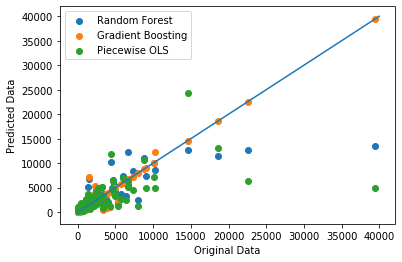

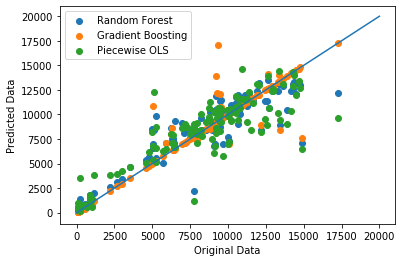

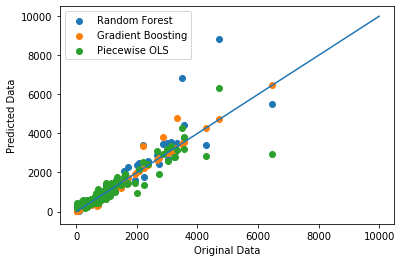

In [253]:
plt.scatter(sub_df_1_agg['future_tweets'], rf_pred_1, label = 'Random Forest')
plt.scatter(sub_df_1_agg['future_tweets'], gb_pred_1, label = 'Gradient Boosting')
plt.scatter(sub_df_1_agg['future_tweets'], piece_pred_1, label = 'Piecewise OLS')
plt.plot([0,40000],[0,40000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

plt.scatter(sub_df_2_agg['future_tweets'], rf_pred_2, label = 'Random Forest')
plt.scatter(sub_df_2_agg['future_tweets'], gb_pred_2, label = 'Gradient Boosting')
plt.scatter(sub_df_2_agg['future_tweets'], piece_pred_2, label = 'Piecewise OLS')
plt.plot([0,20000],[0,20000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

plt.scatter(sub_df_3_agg['future_tweets'], rf_pred_3, label = 'Random Forest')
plt.scatter(sub_df_3_agg['future_tweets'], gb_pred_3, label = 'Gradient Boosting')
plt.scatter(sub_df_3_agg['future_tweets'], piece_pred_3, label = 'Piecewise OLS')
plt.plot([0,10000],[0,10000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

In [247]:
print(clf_rf.cv_results_['split0_test_score'][1479])
print(clf_rf.cv_results_['split1_test_score'][1479])
print(clf_rf.cv_results_['split2_test_score'][1479])
print(clf_rf.cv_results_['split3_test_score'][1479])
print(clf_rf.cv_results_['split4_test_score'][1479])

-948718.6192003511
-3864431.3979146993
-3768871.2264506486
-11507700.400394661
-1769011.32661914


In [249]:
print(clf_gb.cv_results_['split0_test_score'][1564])
print(clf_gb.cv_results_['split1_test_score'][1564])
print(clf_gb.cv_results_['split2_test_score'][1564])
print(clf_gb.cv_results_['split3_test_score'][1564])
print(clf_gb.cv_results_['split4_test_score'][1564])

-3374181.7108393717
-3784610.099351981
-1895304.9939291882
-10399348.182098383
-2509366.647156615


In [325]:
Split_X = [sub_df_1_agg.drop(columns = ['future_tweets']), sub_df_2_agg.drop(columns = ['future_tweets']), sub_df_3_agg.drop(columns = ['future_tweets'])]
Split_y = [sub_df_1_agg['future_tweets'], sub_df_2_agg['future_tweets'], sub_df_3_agg['future_tweets']]

best_gbs = []
gbs_grid_serch = []
for i in range(3):
    clf_gb_piece = GridSearchCV(estimator = GradientBoostingRegressor(), 
    param_grid = grid_param, cv = KFold(5, shuffle=True),
    scoring = 'neg_mean_squared_error', n_jobs = 8)
    clf_gb_piece.fit(Split_X[i], Split_y[i])
    gbs_grid_serch.append(clf_gb_piece)
    best_gbs.append(clf_gb_piece.best_estimator_)

/Users/rover/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/Users/rover/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/Users/rover/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [330]:
print(gbs_grid_serch[1].cv_results_['split0_test_score'][1629])
print(gbs_grid_serch[1].cv_results_['split1_test_score'][1629])
print(gbs_grid_serch[1].cv_results_['split2_test_score'][1629])
print(gbs_grid_serch[1].cv_results_['split3_test_score'][1629])
print(gbs_grid_serch[1].cv_results_['split4_test_score'][1629])

-4122915.1798036015
-2094465.3780338175
-5355223.930157965
-3446577.737872832
-5231515.3486473635


In [281]:
print(clf_gb_piece.cv_results_['split0_test_score'][1502])
print(clf_gb_piece.cv_results_['split1_test_score'][1502])
print(clf_gb_piece.cv_results_['split2_test_score'][1502])
print(clf_gb_piece.cv_results_['split3_test_score'][1502])
print(clf_gb_piece.cv_results_['split4_test_score'][1502])

-53299.024668666396
-50056.29890078985
-75856.53336976057
-811444.8720097105
-97370.403250144


In [274]:
split_gb_pred_1 = best_gbs[0].predict(sub_df_1_agg.drop(columns = ['future_tweets']))
split_gb_pred_2 = best_gbs[1].predict(sub_df_2_agg.drop(columns = ['future_tweets']))
split_gb_pred_3 = best_gbs[2].predict(sub_df_3_agg.drop(columns = ['future_tweets']))
print(mean_squared_error(split_gb_pred_1, sub_df_1_agg['future_tweets']))
print(mean_squared_error(split_gb_pred_2, sub_df_2_agg['future_tweets']))
print(mean_squared_error(split_gb_pred_3, sub_df_3_agg['future_tweets']))

0.2187721171218048
9.987395315834144e-08
9.99393768858349e-08


# Question 11, 12, 13

In [258]:
from sklearn.neural_network import MLPRegressor

In [259]:
tt = [feature_gohawks, feature_gopatriots, feature_nfl, feature_patriots, feature_sb49, feature_superbowl]
feature_alltag = pd.concat(tt)
prior_date_data = feature_alltag.loc[feature_alltag['date'].astype('int') < 20150201]
date_data = feature_alltag.loc[feature_alltag['date'].astype('int') == 20150201]
post_date_data = feature_alltag.loc[feature_alltag['date'].astype('int') > 20150201]

sub_df_1 = pd.concat([prior_date_data, date_data.loc[date_data['hour'] <= 7]]) 
sub_df_2 = date_data.loc[(date_data['hour'] >= 8) & (date_data['hour'] <= 19)]
sub_df_3 = pd.concat([post_date_data, date_data.loc[date_data['hour'] >= 20]]) 

sub_df_1_agg, sub_df_3_agg = piecewise_group_features(sub_df_1, 60), piecewise_group_features(sub_df_3, 60)
sub_df_2_agg = piecewise_group_features(sub_df_2, 5)

sub_df_1_agg['future_tweets'] = sub_df_1_agg['tweets']
sub_df_1_agg.future_tweets = sub_df_1_agg.future_tweets.shift(-1)
sub_df_2_agg['future_tweets'] = sub_df_2_agg['tweets']
sub_df_2_agg.future_tweets = sub_df_2_agg.future_tweets.shift(-1)
sub_df_3_agg['future_tweets'] = sub_df_3_agg['tweets']
sub_df_3_agg.future_tweets = sub_df_3_agg.future_tweets.shift(-1)
sub_df_1_agg.drop(sub_df_1_agg.tail(1).index,inplace=True)
sub_df_2_agg.drop(sub_df_2_agg.tail(1).index,inplace=True)
sub_df_3_agg.drop(sub_df_3_agg.tail(1).index,inplace=True)

feature_alltag_agg = pd.concat([sub_df_1_agg, sub_df_2_agg, sub_df_3_agg])
feature_alltag_agg.index = range(feature_alltag_agg.shape[0])
X, y = feature_alltag_agg.drop(columns=['future_tweets']), feature_alltag_agg['future_tweets']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [265]:
hidden_layer_sizes = [128, 256, [128, 128], [128, 256], [128, 256, 256], [128, 256, 512], [128, 512, 512], [256, 256, 512], [128, 256, 512, 1024]]
mlp_mse = []
for i in range(9):
    mlp = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes[i])
    mlp.fit(X, y)
    mlp_mse.append(mean_squared_error(y, mlp.predict(X)))
print(mlp_mse)

[15356098.324098885, 23427420.35236473, 15213171.821890559, 62327279.66923241, 19601617.913832158, 11607296.066794224, 119554412.84040654, 11753296.680520952, 12196259.543609638]


In [266]:
from sklearn.preprocessing import StandardScaler

In [269]:
scaler = StandardScaler()
scaler.fit(X)
X_trans = scaler.transform(X)
mlp_mse_trans = []
for i in range(9):
    mlp = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes[i])
    mlp.fit(X_trans, y)
    mlp_mse_trans.append(mean_squared_error(y, mlp.predict(X_trans)))
print(mlp_mse_trans)

[15798924.430897918, 11542214.223480433, 4144304.8722335305, 3969008.4495240957, 2852213.82314199, 2822091.2651696852, 2344872.3583967364, 2758967.238791165, 1145791.461177533]


In [284]:
mlp_grid = {'hidden_layer_sizes': [[128, 256, 512, 1024],[128, 128, 128, 128],[256, 256, 512, 1024],[256, 256, 256, 1024],[256, 256, 256, 256],[128, 512, 512, 1024],[512, 512, 512, 1024],[512, 521, 512, 512],[128, 256, 1024, 1024],[128, 1024, 512, 1024],[1024, 1024, 1024, 1024],[128, 1024, 1024, 1024],[64, 256, 512, 1024],[128, 512, 256, 1024],[512, 256, 128, 1024],[1024, 512, 256, 128],[512, 512, 256, 128],[256, 512, 256, 128]]}
best_mlps = []
for i in range(3):
    clf_mlp_piece = GridSearchCV(estimator = MLPRegressor(), 
    param_grid = mlp_grid, cv = KFold(5, shuffle=True),
    scoring = 'neg_mean_squared_error', n_jobs = 8)
    clf_mlp_piece.fit(scaler.transform(Split_X[i]), Split_y[i])
    best_mlps.append(clf_mlp_piece.best_estimator_)

/Users/rover/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/Users/rover/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/Users/rover/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [291]:
mlp_pred_1 = best_mlps[0].predict(scaler.transform(Split_X[0]))
mlp_pred_2 = best_mlps[1].predict(scaler.transform(Split_X[1]))
mlp_pred_3 = best_mlps[2].predict(scaler.transform(Split_X[2]))
print(mean_squared_error(mlp_pred_1, Split_y[0]))
print(mean_squared_error(mlp_pred_2, Split_y[1]))
print(mean_squared_error(mlp_pred_3, Split_y[2]))

2958253.244430492
1983465.4464066846
10995.319961184796


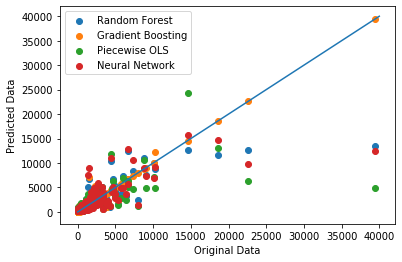

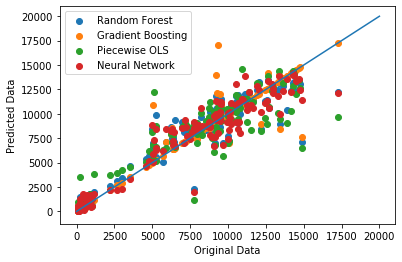

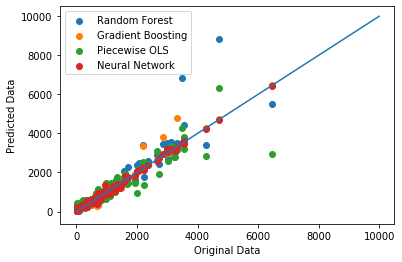

In [293]:
plt.scatter(sub_df_1_agg['future_tweets'], rf_pred_1, label = 'Random Forest')
plt.scatter(sub_df_1_agg['future_tweets'], gb_pred_1, label = 'Gradient Boosting')
plt.scatter(sub_df_1_agg['future_tweets'], piece_pred_1, label = 'Piecewise OLS')
plt.scatter(sub_df_1_agg['future_tweets'], mlp_pred_1, label = 'Neural Network')
plt.plot([0,40000],[0,40000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

plt.scatter(sub_df_2_agg['future_tweets'], rf_pred_2, label = 'Random Forest')
plt.scatter(sub_df_2_agg['future_tweets'], gb_pred_2, label = 'Gradient Boosting')
plt.scatter(sub_df_2_agg['future_tweets'], piece_pred_2, label = 'Piecewise OLS')
plt.scatter(sub_df_2_agg['future_tweets'], mlp_pred_2, label = 'Neural Network')
plt.plot([0,20000],[0,20000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

plt.scatter(sub_df_3_agg['future_tweets'], rf_pred_3, label = 'Random Forest')
plt.scatter(sub_df_3_agg['future_tweets'], gb_pred_3, label = 'Gradient Boosting')
plt.scatter(sub_df_3_agg['future_tweets'], piece_pred_3, label = 'Piecewise OLS')
plt.scatter(sub_df_3_agg['future_tweets'], mlp_pred_3, label = 'Neural Network')
plt.plot([0,10000],[0,10000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

# Question 14

In [299]:
#Data pre-processing
filenames = ['ECE219_tweet_test/sample0_period1.txt',
            'ECE219_tweet_test/sample0_period2.txt',
            'ECE219_tweet_test/sample0_period3.txt',

            'ECE219_tweet_test/sample1_period1.txt',
            'ECE219_tweet_test/sample1_period2.txt',
            'ECE219_tweet_test/sample1_period3.txt',

            'ECE219_tweet_test/sample2_period1.txt',
            'ECE219_tweet_test/sample2_period2.txt',
            'ECE219_tweet_test/sample2_period3.txt'
            ]

output_filenames = ['output/sample0_period1.txt',
            'output/sample0_period2.txt',
            'output/sample0_period3.txt',

            'output/sample1_period1.txt',
            'output/sample1_period2.txt',
            'output/sample1_period3.txt',

            'output/sample2_period1.txt',
            'output/sample2_period2.txt',
            'output/sample2_period3.txt'
            ]
for i in range(len(filenames)):
    pst_tz = pytz.timezone('US/Pacific')
    
    with open(filenames[i], 'r',encoding="utf8") as reader:
        feature_headers = [
                   'citation_date_raw',
                   'author_nick_names',
                   'tweets',
                   'retweets',
                   'urls',
                   'mentions',
                   'hashtags',
                   'followers',
                   'followers_max',
                  ]
        with open(output_filenames[i], 'w') as writer:
            feature_csv_writer = csv.writer(writer, lineterminator='\n')
            feature_csv_writer.writerow(feature_headers)
            for line in reader:
                feature_data = json.loads(line)
                feature_response =  [
                            feature_data['citation_date'],
                            feature_data['author']['nick'],
                            1, # there is one tweet at a time..
                            feature_data['metrics']['citations']['total'], #retweets
                            len(feature_data['tweet']['entities']['urls']), #urls
                            len(feature_data['tweet']['entities']['user_mentions']), #mentions
                            len(feature_data['tweet']['entities']['hashtags']), #hashtags
                            feature_data['author']['followers'], #followers
                            feature_data['author']['followers'], #followers
                             ]
                feature_csv_writer.writerow(feature_response)

In [300]:
test_sample0_period1 = pd.read_csv('output/sample0_period1.txt',delimiter=',')
test_sample0_period2 = pd.read_csv('output/sample0_period2.txt',delimiter=',')
test_sample0_period3 = pd.read_csv('output/sample0_period3.txt',delimiter=',')

test_sample1_period1 = pd.read_csv('output/sample1_period1.txt',delimiter=',')
test_sample1_period2 = pd.read_csv('output/sample1_period2.txt',delimiter=',')
test_sample1_period3 = pd.read_csv('output/sample1_period3.txt',delimiter=',')

test_sample2_period1 = pd.read_csv('output/sample2_period1.txt',delimiter=',')
test_sample2_period2 = pd.read_csv('output/sample2_period2.txt',delimiter=',')
test_sample2_period3 = pd.read_csv('output/sample2_period3.txt',delimiter=',')

# parse date for use down below.
parse_date_pst(test_sample0_period1)
parse_date_pst(test_sample0_period2)
parse_date_pst(test_sample0_period3)
parse_date_pst(test_sample1_period1)
parse_date_pst(test_sample1_period2)
parse_date_pst(test_sample1_period3)
parse_date_pst(test_sample2_period1)
parse_date_pst(test_sample2_period2)
parse_date_pst(test_sample2_period3)

In [301]:
test_sample0_period1

,citation_date_raw,author_nick_names,tweets,retweets,urls,mentions,hashtags,followers,followers_max,citation_date,citation_date_pst,date,hour,minute
0,1422709237,lumiauk,1,1,1,0,3,98191.0,98191.0,2015-01-31 13:00:37,2015-01-31 05:00:37-08:00,20150131,5,0
1,1422709279,netizennick,1,1,1,0,3,158.0,158.0,2015-01-31 13:01:19,2015-01-31 05:01:19-08:00,20150131,5,1
2,1422709683,redditnfl,1,1,2,1,1,187.0,187.0,2015-01-31 13:08:03,2015-01-31 05:08:03-08:00,20150131,5,8
3,1422709802,topseahawks,1,1,1,0,1,1352.0,1352.0,2015-01-31 13:10:02,2015-01-31 05:10:02-08:00,20150131,5,10
4,1422709818,craigmilroy,1,2,1,1,4,1427.0,1427.0,2015-01-31 13:10:18,2015-01-31 05:10:18-08:00,20150131,5,10
5,1422711645,dhianam,1,2,0,0,1,1749.0,1749.0,2015-01-31 13:40:45,2015-01-31 05:40:45-08:00,20150131,5,40
6,1422711973,sf49ersfans1,1,1,1,0,5,3344.0,3344.0,2015-01-31 13:46:13,2015-01-31 05:46:13-08:00,20150131,5,46
7,1422712506,topredskins,1,1,1,0,2,1693.0,1693.0,2015-01-31 13:55:06,2015-01-31 05:55:06-08:00,20150131,5,55
8,1422712717,bob_lazzari,1,1,0,1,1,339.0,339.0,2015-01-31 13:58:37,2015-01-31 05:58:37-08:00,20150131,5,58
9,1422712809,ltj81,1,1,1,1,3,1825.0,1825.0,2015-01-31 14:00:09,2015-01-31 06:00:09-08:00,20150131,6,0


In [304]:
# prepare testing data
test_sample0_period1_agg, test_sample0_period3_agg = piecewise_group_features(test_sample0_period1, 60), piecewise_group_features(test_sample0_period3, 60)
test_sample0_period2_agg = piecewise_group_features(test_sample0_period2, 5)

test_sample1_period1_agg, test_sample1_period3_agg = piecewise_group_features(test_sample1_period1, 60), piecewise_group_features(test_sample1_period3, 60)
test_sample1_period2_agg = piecewise_group_features(test_sample1_period2, 5)

test_sample2_period1_agg, test_sample2_period3_agg = piecewise_group_features(test_sample2_period1, 60), piecewise_group_features(test_sample2_period3, 60)
test_sample2_period2_agg = piecewise_group_features(test_sample2_period2, 5)

In [323]:
# testing sample 1
print(mean_squared_error(best_mlps[0].predict(scaler.transform(test_sample0_period1_agg))[0:-1], test_sample0_period1_agg['tweets'].shift(-1)[0:-1]))
print(mean_squared_error(best_mlps[1].predict(scaler.transform(test_sample0_period2_agg))[0:-1], test_sample0_period2_agg['tweets'].shift(-1)[0:-1]))
print(mean_squared_error(best_mlps[2].predict(scaler.transform(test_sample0_period3_agg))[0:-1], test_sample0_period3_agg['tweets'].shift(-1)[0:-1]))

# testing sample 2
print(mean_squared_error(best_mlps[0].predict(scaler.transform(test_sample1_period1_agg))[0:-1], test_sample1_period1_agg['tweets'].shift(-1)[0:-1]))
print(mean_squared_error(best_mlps[1].predict(scaler.transform(test_sample1_period2_agg))[0:-1], test_sample1_period2_agg['tweets'].shift(-1)[0:-1]))
print(mean_squared_error(best_mlps[2].predict(scaler.transform(test_sample1_period3_agg))[0:-1], test_sample1_period3_agg['tweets'].shift(-1)[0:-1]))

# testing sample 3
print(mean_squared_error(best_mlps[0].predict(scaler.transform(test_sample2_period1_agg))[0:-1], test_sample2_period1_agg['tweets'].shift(-1)[0:-1]))
print(mean_squared_error(best_mlps[1].predict(scaler.transform(test_sample2_period2_agg))[0:-1], test_sample2_period2_agg['tweets'].shift(-1)[0:-1]))
print(mean_squared_error(best_mlps[2].predict(scaler.transform(test_sample2_period3_agg))[0:-1], test_sample2_period3_agg['tweets'].shift(-1)[0:-1]))

22727.56396743177
1374785.9319289878
1520.9282403095986
19714.705625832594
836698.9221230072
31464.24626972903
49801.570742798096
395142.2404779382
55235.58990351843


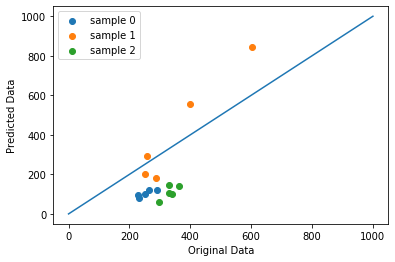

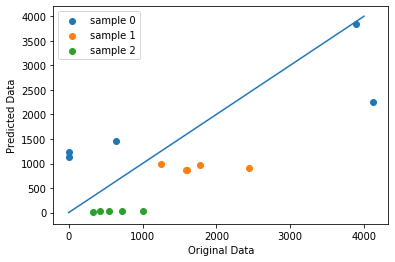

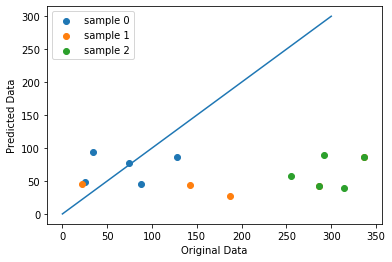

In [324]:
plt.scatter(best_mlps[0].predict(scaler.transform(test_sample0_period1_agg))[0:-1], test_sample0_period1_agg['tweets'].shift(-1)[0:-1], label = 'sample 0')
plt.scatter(best_mlps[0].predict(scaler.transform(test_sample1_period1_agg))[0:-1], test_sample1_period1_agg['tweets'].shift(-1)[0:-1], label = 'sample 1')
plt.scatter(best_mlps[0].predict(scaler.transform(test_sample2_period1_agg))[0:-1], test_sample2_period1_agg['tweets'].shift(-1)[0:-1], label = 'sample 2')
plt.plot([0,1000],[0,1000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

plt.scatter(best_mlps[1].predict(scaler.transform(test_sample0_period2_agg))[0:-1], test_sample0_period2_agg['tweets'].shift(-1)[0:-1], label = 'sample 0')
plt.scatter(best_mlps[1].predict(scaler.transform(test_sample1_period2_agg))[0:-1], test_sample1_period2_agg['tweets'].shift(-1)[0:-1], label = 'sample 1')
plt.scatter(best_mlps[1].predict(scaler.transform(test_sample2_period2_agg))[0:-1], test_sample2_period2_agg['tweets'].shift(-1)[0:-1], label = 'sample 2')
plt.plot([0,4000],[0,4000])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()

plt.scatter(best_mlps[2].predict(scaler.transform(test_sample0_period3_agg))[0:-1], test_sample0_period3_agg['tweets'].shift(-1)[0:-1], label = 'sample 0')
plt.scatter(best_mlps[2].predict(scaler.transform(test_sample1_period3_agg))[0:-1], test_sample1_period3_agg['tweets'].shift(-1)[0:-1], label = 'sample 1')
plt.scatter(best_mlps[2].predict(scaler.transform(test_sample2_period3_agg))[0:-1], test_sample2_period3_agg['tweets'].shift(-1)[0:-1], label = 'sample 2')
plt.plot([0,300],[0,300])
plt.legend()
plt.xlabel('Original Data')
plt.ylabel('Predicted Data')
plt.show()